# Import Libraries

In [1]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Data Understanding

In [2]:
df = pd.read_csv('restaurant_data.csv')
df

,Name,Location,Cuisine,Rating,Seating Capacity,Average Meal Price,Marketing Budget,Social Media Followers,Chef Experience Years,Number of Reviews,Avg Review Length,Ambience Score,Service Quality Score,Parking Availability,Weekend Reservations,Weekday Reservations,Revenue
0,Restaurant 0,Rural,Japanese,4.0,38,73.98,2224,23406,13,185,161.924906,1.3,7.0,Yes,13,4,638945.52
1,Restaurant 1,Downtown,Mexican,3.2,76,28.11,4416,42741,8,533,148.759717,2.6,3.4,Yes,48,6,490207.83
2,Restaurant 2,Rural,Italian,4.7,48,48.29,2796,37285,18,853,56.849189,5.3,6.7,No,27,14,541368.62
3,Restaurant 3,Rural,Italian,4.4,34,51.55,1167,15214,13,82,205.433265,4.6,2.8,Yes,9,17,404556.80
4,Restaurant 4,Downtown,Japanese,4.9,88,75.98,3639,40171,9,78,241.681584,8.6,2.1,No,37,26,1491046.35
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8363,Restaurant 8363,Suburban,Indian,3.4,54,34.85,1102,11298,11,380,253.919515,9.5,5.0,Yes,37,0,434653.45
8364,Restaurant 8364,Rural,Indian,3.7,49,36.88,1988,20432,9,713,175.590195,2.7,2.6,No,37,21,414977.92
8365,Restaurant 8365,Downtown,Italian,4.7,88,46.87,5949,63945,6,436,222.953647,4.8,1.7,Yes,83,21,930395.87
8366,Restaurant 8366,Rural,American,3.1,31,44.53,707,7170,1,729,178.482851,6.1,2.1,No,6,21,311493.48


In [3]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8368 entries, 0 to 8367
Data columns (total 17 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   Name                    8368 non-null   object 
 1   Location                8368 non-null   object 
 2   Cuisine                 8368 non-null   object 
 3   Rating                  8368 non-null   float64
 4   Seating Capacity        8368 non-null   int64  
 5   Average Meal Price      8368 non-null   float64
 6   Marketing Budget        8368 non-null   int64  
 7   Social Media Followers  8368 non-null   int64  
 8   Chef Experience Years   8368 non-null   int64  
 9   Number of Reviews       8368 non-null   int64  
 10  Avg Review Length       8368 non-null   float64
 11  Ambience Score          8368 non-null   float64
 12  Service Quality Score   8368 non-null   float64
 13  Parking Availability    8368 non-null   object 
 14  Weekend Reservations    8368 non-null   

# Data Cleaning

In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8368 entries, 0 to 8367
Data columns (total 17 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   Name                    8368 non-null   object 
 1   Location                8368 non-null   object 
 2   Cuisine                 8368 non-null   object 
 3   Rating                  8368 non-null   float64
 4   Seating Capacity        8368 non-null   int64  
 5   Average Meal Price      8368 non-null   float64
 6   Marketing Budget        8368 non-null   int64  
 7   Social Media Followers  8368 non-null   int64  
 8   Chef Experience Years   8368 non-null   int64  
 9   Number of Reviews       8368 non-null   int64  
 10  Avg Review Length       8368 non-null   float64
 11  Ambience Score          8368 non-null   float64
 12  Service Quality Score   8368 non-null   float64
 13  Parking Availability    8368 non-null   object 
 14  Weekend Reservations    8368 non-null   

No Missing Values!

In [5]:
df.duplicated().sum()

0

No duplicated data!

# Statistical Summary

In [6]:
# Group columns by data type
categoricals = ['Name', 'Location', 'Cuisine', 'Parking Availability']

numericals = ['Rating', 'Seating Capacity', 'Average Meal Price', 'Marketing Budget', 'Social Media Followers', 'Chef Experience Years',
              'Number of Reviews', 'Avg Review Length', 'Ambience Score', 'Service Quality Score', 'Weekend Reservations', 'Weekday Reservations',
              'Revenue']

In [7]:
df[numericals].describe()

,Rating,Seating Capacity,Average Meal Price,Marketing Budget,Social Media Followers,Chef Experience Years,Number of Reviews,Avg Review Length,Ambience Score,Service Quality Score,Weekend Reservations,Weekday Reservations,Revenue
count,8368.000000,8368.000000,8368.000000,8368.000000,8368.000000,8368.000000,8368.000000,8368.000000,8368.000000,8368.000000,8368.000000,8368.000000,8.368000e+03
mean,4.008258,60.212835,47.896659,3218.254900,36190.621773,10.051984,523.010397,174.769974,5.521283,5.508772,29.491754,29.235301,6.560706e+05
std,0.581474,17.399488,14.336767,1824.896053,18630.153330,5.516606,277.215127,71.998060,2.575442,2.586552,20.025415,20.004277,2.674137e+05
min,3.000000,30.000000,25.000000,604.000000,5277.000000,1.000000,50.000000,50.011717,1.000000,1.000000,0.000000,0.000000,1.847085e+05
25%,3.500000,45.000000,35.490000,1889.000000,22592.500000,5.000000,277.000000,113.311102,3.300000,3.200000,13.000000,13.000000,4.546514e+05
50%,4.000000,60.000000,45.535000,2846.500000,32518.500000,10.000000,528.000000,173.910079,5.500000,5.600000,27.000000,26.000000,6.042421e+05
75%,4.500000,75.000000,60.300000,4008.500000,44566.250000,15.000000,764.250000,237.406885,7.800000,7.800000,43.000000,43.000000,8.130942e+05
max,5.000000,90.000000,76.000000,9978.000000,103777.000000,19.000000,999.000000,299.984924,10.000000,10.000000,88.000000,88.000000,1.531868e+06


- All numeric columns exhibit **consistent and expected minimum and maximum values**
- The Avg Review Length column indicates the Average length of review, with **the maximum length reaching 299** (assumed to be 299 words) and a **median value of 173**.

In [8]:
df[categoricals].describe()

,Name,Location,Cuisine,Parking Availability
count,8368,8368,8368,8368
unique,8368,3,6,2
top,Restaurant 0,Downtown,French,Yes
freq,1,2821,1433,4189


In [9]:
cuisine_item_count = df['Cuisine'].value_counts()
location_item_count = df['Location'].value_counts()
parking_item_count = df['Parking Availability'].value_counts()

# Or you can use a dictionary to store the counts
item_counts = {
    'Cuisine': df['Cuisine'].value_counts(),
    'Location': df['Location'].value_counts(),
    'Parking Availability': df['Parking Availability'].value_counts()
}
item_counts

{'Cuisine': Cuisine
 French      1433
 American    1416
 Italian     1413
 Mexican     1393
 Indian      1369
 Japanese    1344
 Name: count, dtype: int64,
 'Location': Location
 Downtown    2821
 Suburban    2785
 Rural       2762
 Name: count, dtype: int64,
 'Parking Availability': Parking Availability
 Yes    4189
 No     4179
 Name: count, dtype: int64}

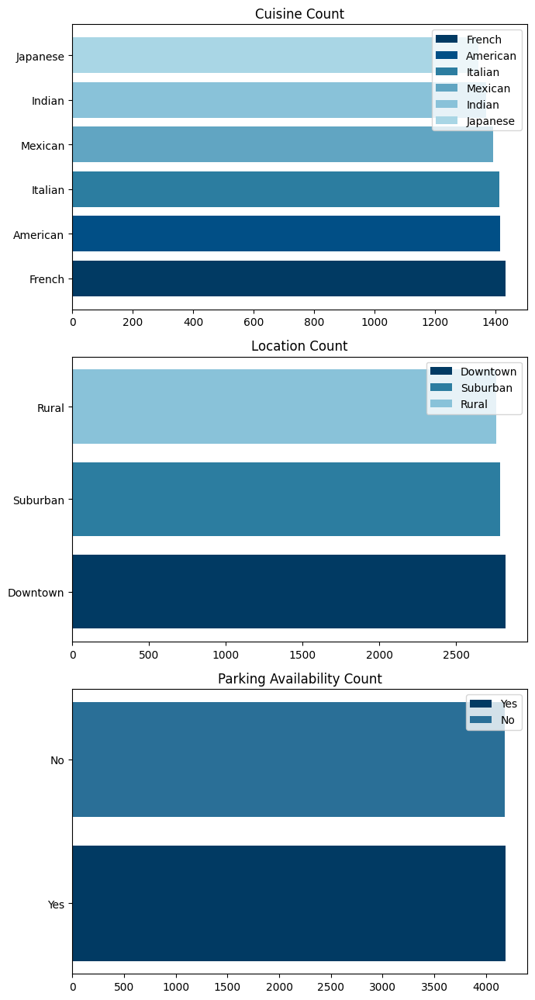

In [26]:
# Get unique categories
cuisine_categories = cuisine_item_count.index
location_categories = location_item_count.index
parking_categories = parking_item_count.index

# Define colors for each category
cuisine_colors = ['#013a63', '#014f86', '#2c7da0', '#61a5c2', '#89c2d9', '#a9d6e5']
location_colors = ['#013a63', '#2c7da0', '#89c2d9']
parking_colors = ['#013a63', '#2a6f97']

# Plotting
fig, axes = plt.subplots(3, 1, figsize=(7, 13))

# Cuisine plot
for i, (category, count) in enumerate(zip(cuisine_categories, cuisine_item_count.values)):
    axes[0].barh(category, count, color=cuisine_colors[i % len(cuisine_colors)], label=category)
axes[0].set_title('Cuisine Count')
axes[0].legend()

# Location plot
for i, (category, count) in enumerate(zip(location_categories, location_item_count.values)):
    axes[1].barh(category, count, color=location_colors[i % len(location_colors)], label=category)
axes[1].set_title('Location Count')
axes[1].legend()

# Parking Availability plot
for i, (category, count) in enumerate(zip(parking_categories, parking_item_count.values)):
    axes[2].barh(category, count, color=parking_colors[i % len(parking_colors)], label=category)
axes[2].set_title('Parking Availability Count')
axes[2].legend()

plt.tight_layout()
plt.show()

The **data distribution** across the columns seems to be quite **balanced**

# Univariate Analysis

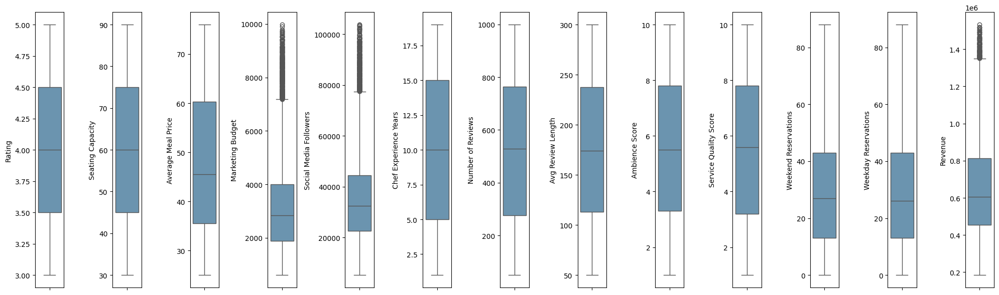

In [27]:
plt.figure(figsize=(20,6))
features = numericals
for i in range(0, len(features)):
    plt.subplot(1, len(features), i+1)
    sns.boxplot(y=df[features[i]], color='#6096ba')
    plt.tight_layout()

In [28]:
def detect_outliers(series):
    Q1 = series.quantile(0.25)
    Q3 = series.quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR
    return ((series < lower_bound) | (series > upper_bound))



# Count outliers in each numerical column
outliers_count = df[numericals].apply(detect_outliers).sum()
outliers_count

Rating                      0
Seating Capacity            0
Average Meal Price          0
Marketing Budget          389
Social Media Followers    361
Chef Experience Years       0
Number of Reviews           0
Avg Review Length           0
Ambience Score              0
Service Quality Score       0
Weekend Reservations        0
Weekday Reservations        0
Revenue                   102
dtype: int64

There are some outliers in the marketing budget, social media followers, and revenue features

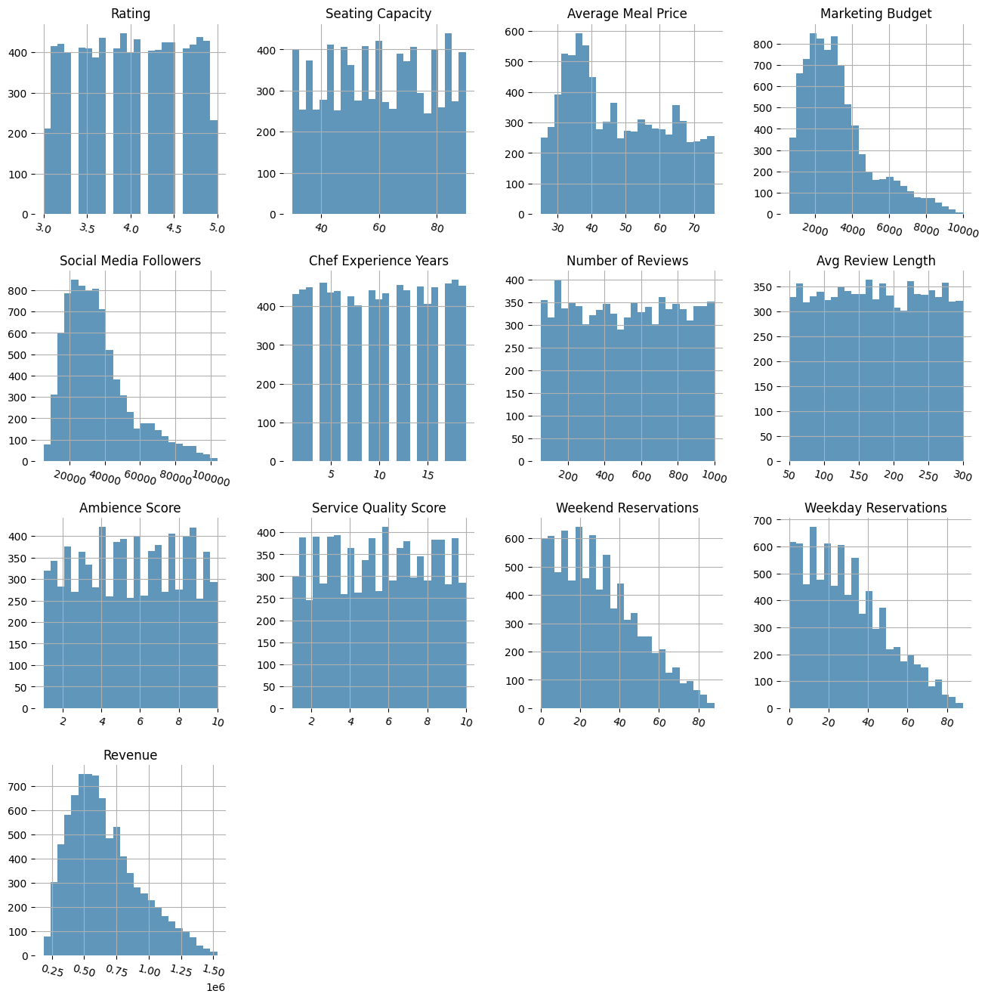

In [29]:
# Numeric Distribution
h = df.hist(bins=25,figsize=(16,16),xlabelsize='10',ylabelsize='10',xrot=-15, color ='#6096ba')
sns.despine(left=True, bottom=True)
[x.title.set_size(12) for x in h.ravel()];
[x.yaxis.tick_left() for x in h.ravel()];

The distributions of Marketing Budget, Social Media Followers, and Revenue exhibit positive skewness.

# Correlation Analysis

<Axes: >

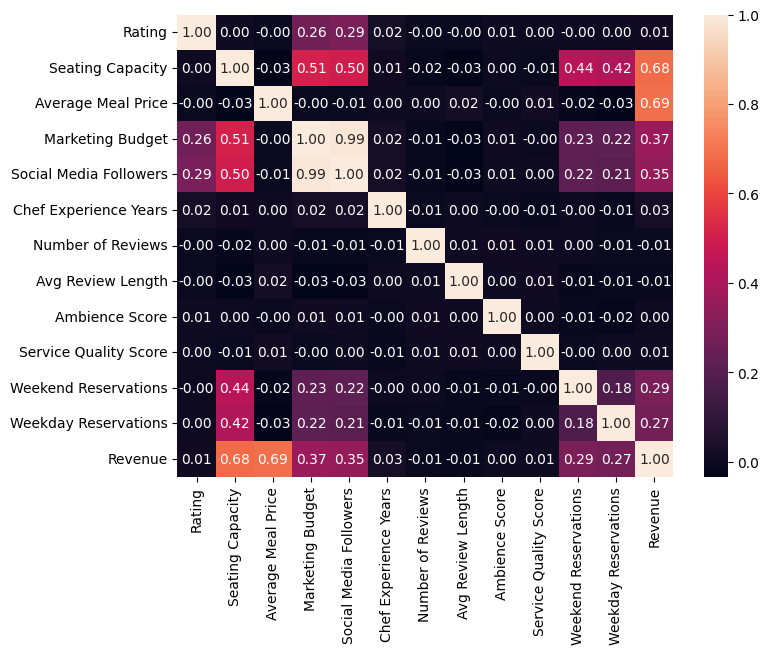

In [30]:
plt.figure(figsize=(8,6))
correlation = df[numericals].corr()
sns.heatmap(correlation, annot=True, fmt='.2f')

- There is a strong correlation between marketing budget and social media followers
- **Revenue** shows **correlations with Seating Capacity and Average Meal Prices**, although these correlations are not particularly strong. These relationships suggest that while seating capacity and average meal prices are **significant factors influencing restaurant revenue**

# Feature Relationships

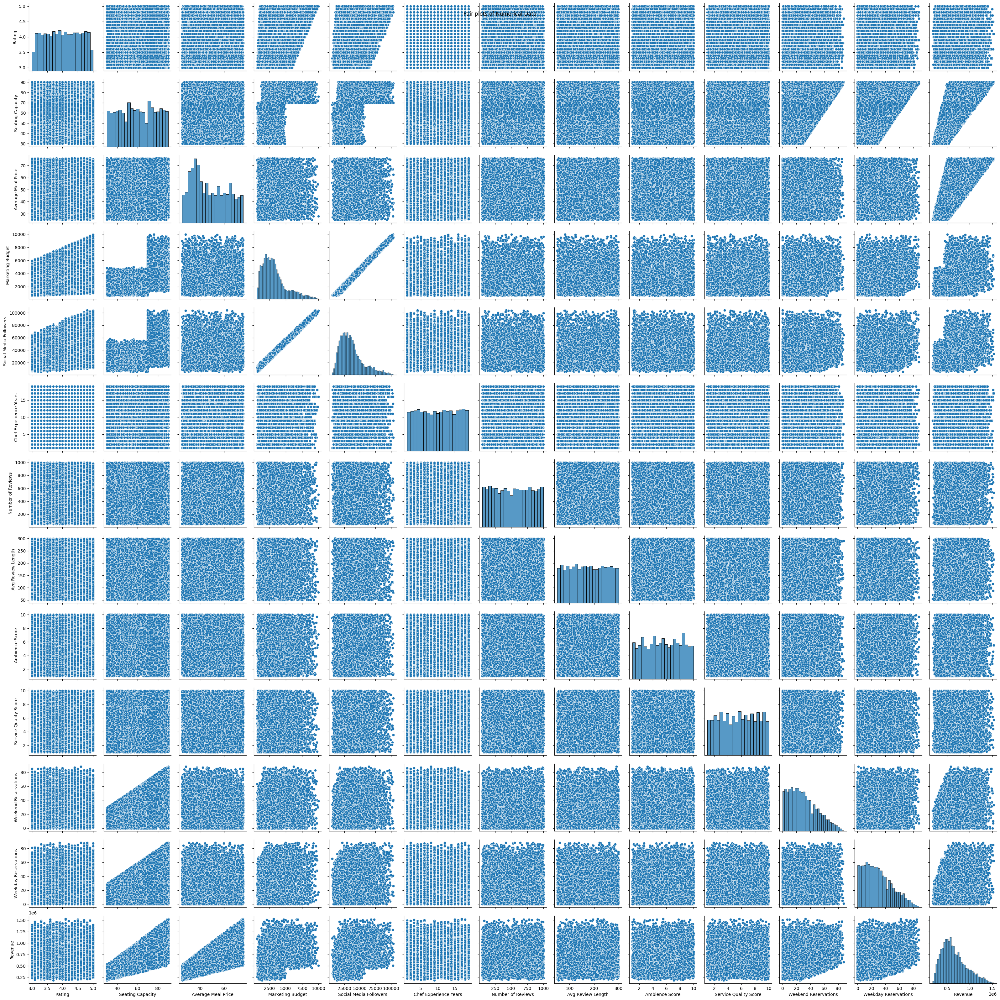

In [31]:
sns.pairplot(df[numericals])
plt.suptitle('Pair plots of Numerical Data')
plt.show()

# Deep Dive EDA

**1. How does customer satisfaction (measured by ratings) affect revenue?**

In [32]:
Ratings = (df
            .groupby('Rating')
            .agg(Revenue_sum =('Revenue','sum'))
            .sort_values('Revenue_sum',ascending=False)
            .reset_index()
            )

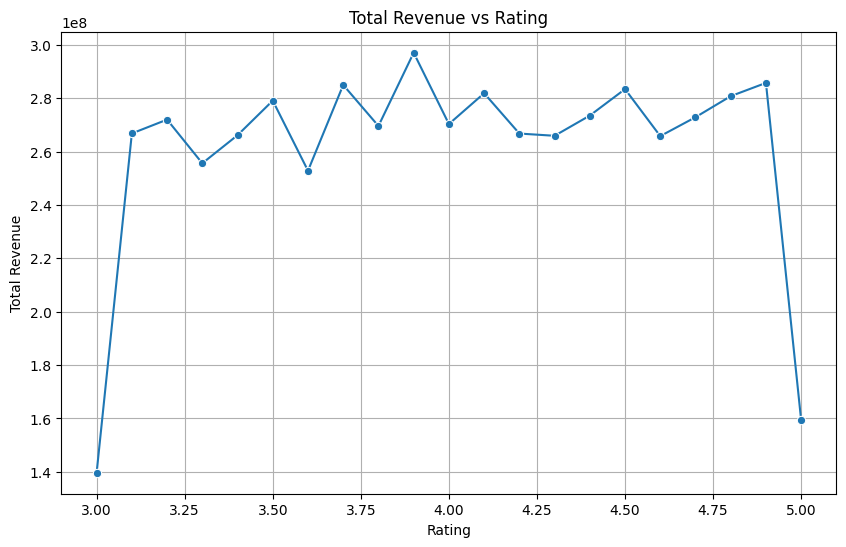

In [33]:
# Plotting using seaborn
plt.figure(figsize=(10, 6))
sns.lineplot(x='Rating', y='Revenue_sum', data=Ratings, marker='o')
plt.title('Total Revenue vs Rating')
plt.xlabel('Rating')
plt.ylabel('Total Revenue')
plt.grid(True)
plt.show()

**2. What are the top 3 cuisine ranked by highest revenue?**

In [34]:
Top_3 = (df
            .groupby('Cuisine')
            .agg(Revenue_sum =('Revenue','sum'))
            .sort_values('Revenue_sum',ascending=False)
            .head(3)
            .reset_index()
            )
Top_3

,Cuisine,Revenue_sum
0,Japanese,1.260630e+09
1,French,1.175352e+09
2,Italian,9.788450e+08


<ipython-input-35-9ac4fa217ffc>:4: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.barplot(data=Top_3, x='Cuisine', y='Revenue_sum', palette=palette)


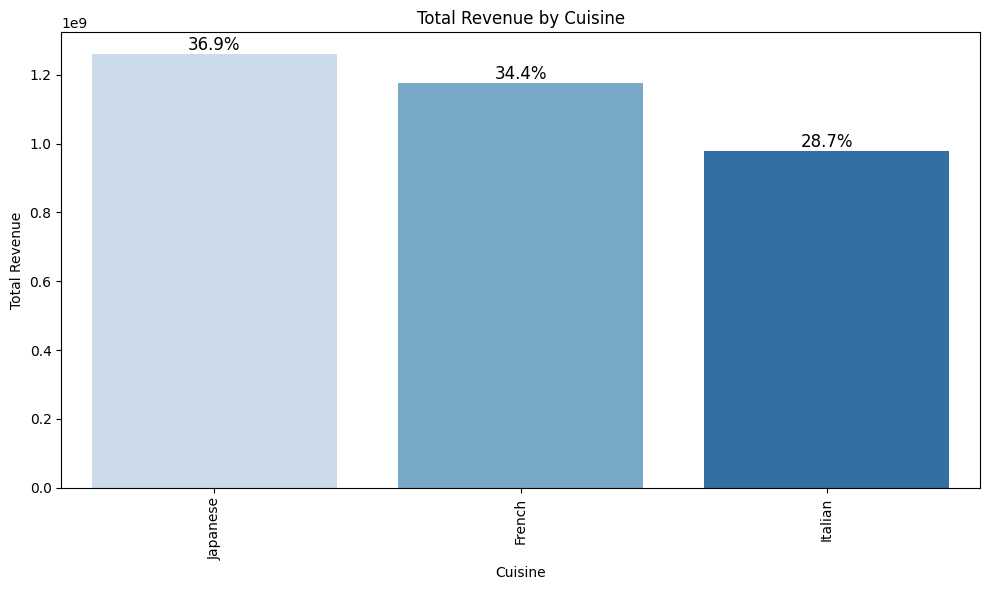

In [35]:
palette = sns.color_palette('Blues', n_colors=len(Top_3))

plt.figure(figsize=(10, 6))
ax = sns.barplot(data=Top_3, x='Cuisine', y='Revenue_sum', palette=palette)

# Adding percentage annotations
total = float(len(Top_3))  # Total number of bars to calculate percentage

for p in ax.patches:
    percentage = '{:.1f}%'.format(100 * p.get_height() / sum(Top_3['Revenue_sum']))
    x = p.get_x() + p.get_width() / 2
    y = p.get_height()
    ax.annotate(percentage, (p.get_x() + p.get_width() / 2, y), ha='center', va='bottom', fontsize=12)

plt.xticks(rotation=90)
plt.xlabel('Cuisine')
plt.ylabel('Total Revenue')
plt.title('Total Revenue by Cuisine')
plt.tight_layout()
plt.show()

**3. How does customer perception of ambience influence restaurant revenue?**

In [36]:
ambience_score = (df
            .groupby('Ambience Score')
            .agg(Revenue_sum =('Revenue','sum'))
            .sort_values('Revenue_sum',ascending=False)
            .reset_index()
            )

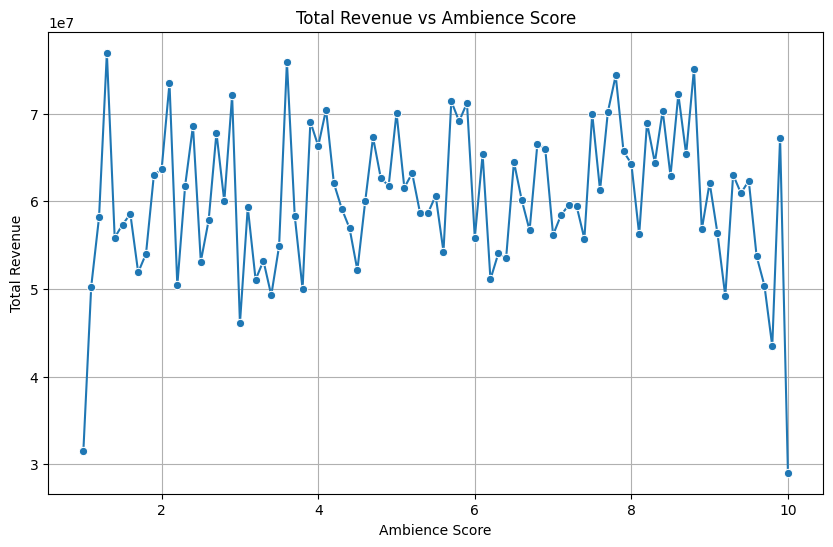

In [37]:
# Plotting using seaborn
plt.figure(figsize=(10, 6))
sns.lineplot(x='Ambience Score', y='Revenue_sum', data=ambience_score, marker='o')
plt.title('Total Revenue vs Ambience Score')
plt.xlabel('Ambience Score')
plt.ylabel('Total Revenue')
plt.grid(True)
plt.show()

**4. How does Service Quality Score vary across different locations of our restaurants?**

In [39]:
low_rating = df[df['Service Quality Score'] <= 5]

low_rating_sum = low_rating.groupby('Location')['Service Quality Score'].sum()
low_rating_sum

Location
Downtown    3825.3
Rural       3726.4
Suburban    3648.2
Name: Service Quality Score, dtype: float64

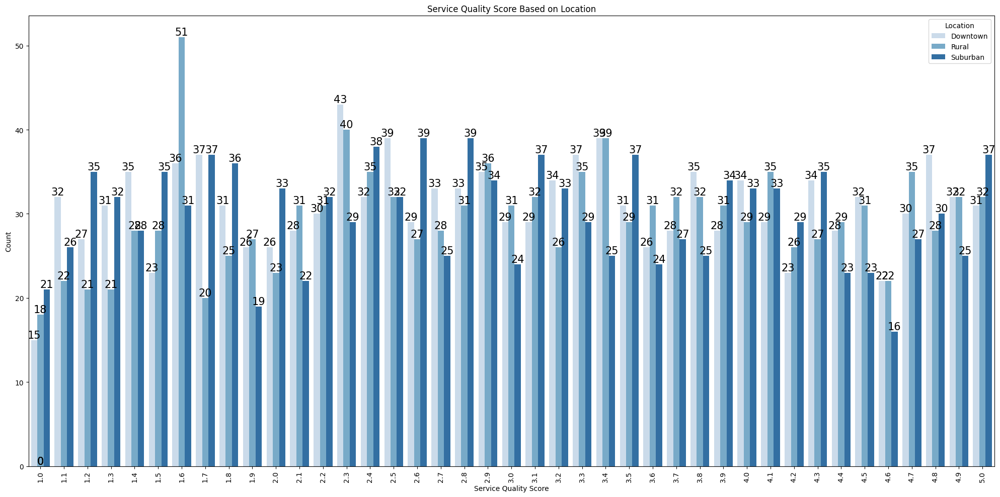

In [40]:
plt.figure(figsize=(20, 10))
ax = sns.countplot(x="Service Quality Score", data=low_rating, palette='Blues', hue='Location')

# Adding count annotations
for p in ax.patches:
    count = '{:.0f}'.format(p.get_height())  # Get the count value
    x = p.get_x() + p.get_width() / 2
    y = p.get_height()
    ax.annotate(count, (x, y), ha='center', va='bottom', fontsize=15)

plt.title('Service Quality Score Based on Location')
plt.xlabel('Service Quality Score')
plt.ylabel('Count')
plt.xticks(rotation=90)
plt.tight_layout()
plt.show()

**HIGH RATING**

In [41]:
high_rating = df[df['Service Quality Score'] >= 6]

high_rating_sum = high_rating.groupby('Location')['Service Quality Score'].sum()
high_rating_sum

Location
Downtown    10191.9
Rural       10088.0
Suburban     9911.0
Name: Service Quality Score, dtype: float64

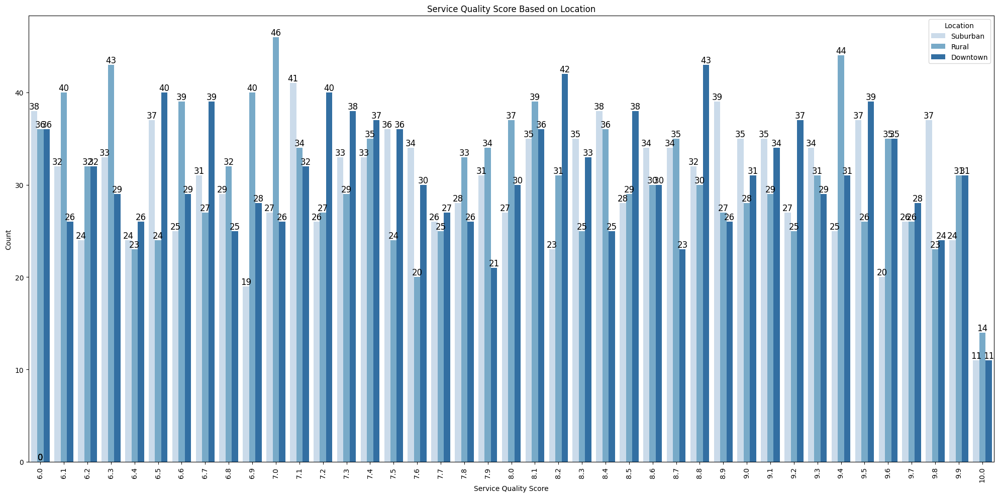

In [42]:
plt.figure(figsize=(20, 10))
ax = sns.countplot(x="Service Quality Score", data=high_rating, palette='Blues', hue='Location')

# Adding count annotations
for p in ax.patches:
    count = '{:.0f}'.format(p.get_height())  # Get the count value
    x = p.get_x() + p.get_width() / 2
    y = p.get_height()
    ax.annotate(count, (x, y), ha='center', va='bottom', fontsize=12)

plt.title('Service Quality Score Based on Location')
plt.xlabel('Service Quality Score')
plt.ylabel('Count')
plt.xticks(rotation=90)
plt.tight_layout()
plt.show()

**5. Do restaurants with higher marketing budgets tend to have more consistent revenue?**

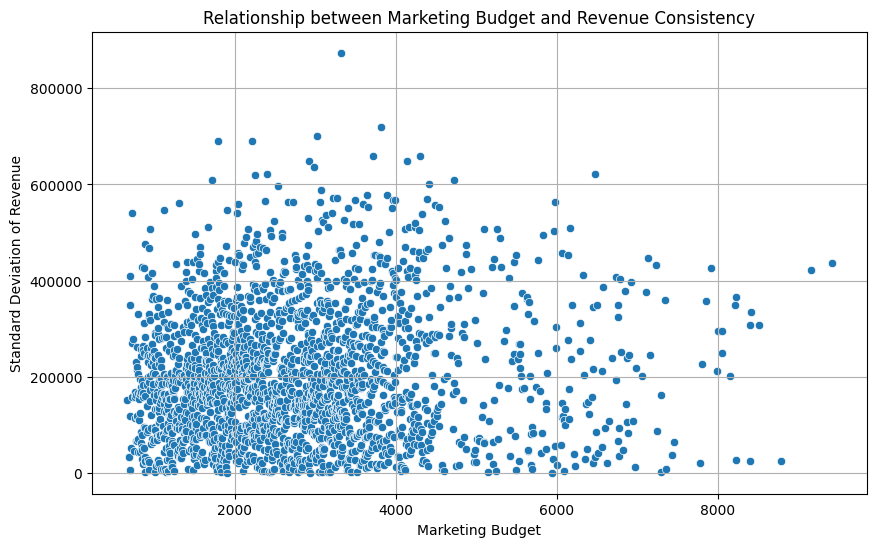

In [43]:
marketing_stats = df.groupby('Marketing Budget')['Revenue'].agg(['mean', 'std']).reset_index()

# Plotting the relationship between marketing budget and revenue consistency
plt.figure(figsize=(10, 6))
sns.scatterplot(x='Marketing Budget', y='std', data=marketing_stats)
plt.title('Relationship between Marketing Budget and Revenue Consistency')
plt.xlabel('Marketing Budget')
plt.ylabel('Standard Deviation of Revenue')
plt.grid(True)
plt.show()

# Valuable Insight

- The correlation between marketing budget and social media followers can often indicate how effectively a restaurant's marketing efforts translate into online engagement. A higher marketing budget typically allows for more extensive promotional activities, which can attract a larger audience on social media platforms.
- While both seating capacity and average meal prices influence restaurant revenue, the strength of their correlation with revenue is moderate at best. This indicates that while these factors play a role in revenue, their impact can be moderated or influenced by other factors
- Higher ratings between 3.9 and 4.9 are likely associated with increased revenue due to enhanced customer satisfaction and positive word-of-mouth.
- Based on the revenue rankings from the dataset, it's clear that Japanese cuisine leads with the highest revenue, suggesting a strong market demand.
- Surprisingly, the highest revenue occurs when the ambience score is at its lowest, around 1.3. This suggests that in some cases, a simpler or less ostentatious ambience might resonate better with customers or fit the restaurant's concept.
- The variability in Service Quality Scores among downtown locations suggests diverse customer experiences. They exhibit the widest range of Service Quality Scores, encompassing both the lowest and highest ratings recorded in the data.
- The scatter plot shows that despite increasing marketing budget, the standard deviation of revenue remains low or exhibits a clustering of points with low standard deviation, this suggests that additional spending on marketing can enhance revenue stability.